In [2]:
import os
import sys
import json
import argparse

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib
import seaborn as sns

from glob import glob
from nilearn.glm.second_level import SecondLevelModel
from nilearn.glm.second_level import make_second_level_design_matrix
from nilearn.image import threshold_img
from nilearn.glm import threshold_stats_img

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/__init__.py:55: FutureWarning: The nilearn.glm module is experimental. It may change in any future release of Nilearn.
  warn('The nilearn.glm module is experimental. '


In [3]:
from nilearn.masking import apply_mask
from scipy import stats

In [4]:
from nilearn import plotting, datasets, surface

# for plotting slices
mni152_template = datasets.load_mni152_template(resolution=1)
# for plotting on surface
fsaverage = datasets.fetch_surf_fsaverage('fsaverage')


Dataset created in /ihome/bchandrasekaran/krs228/nilearn_data/fsaverage



Downloaded 8413184 of 28905506 bytes (29.1%,    2.6s remaining) ...done. (5 seconds, 0 min)
Extracting data from /ihome/bchandrasekaran/krs228/nilearn_data/fsaverage/5592d63c5c8039b4f902396c128dcd85/download..... done.


In [5]:
task_label = 'tonecat'
contrast_label = 'resp'
fwhm = 0.00
space_label = 'MNI152NLin2009cAsym'

# define data directories
bidsroot = os.path.join('/bgfs/bchandrasekaran/krs228/data/', 
                        'FLT/',
                        'data_denoised', #'data_bids'
                       )
nilearn_dir = os.path.join(bidsroot, 'derivatives', 'nilearn')
masks_dir = os.path.join(nilearn_dir, 'masks')
# define first-level directory where group-level inputs will be pulled from
l1_dir = os.path.join(nilearn_dir, 'level-1_fwhm-%.02f'%fwhm)

# create output directory
group_out_dir = os.path.join(nilearn_dir, 'group_fwhm-%.02f'%fwhm)
if not os.path.exists(group_out_dir):
        os.makedirs(group_out_dir)

Based on [nilearn documentation](https://nilearn.github.io/stable/auto_examples/05_glm_second_level/plot_thresholding.html#statistical-testing-of-a-second-level-analysis)

### Build the group-level design matrix

#### Read the `participants.tsv` file from the BIDS root directory

In [6]:
participants_fpath = os.path.join(bidsroot, 'participants.tsv')
participants_df = pd.read_csv(participants_fpath, sep='\t')

# subjects to ignore (not fully processed, etc.)
ignore_subs = ['sub-FLT27', # always leave out FLT27 – did not participate
               'sub-FLT07', # bad QA 11/14/23
               #'sub-FLT02', 'sub-FLT04', 'sub-FLT18', 'sub-FLT19', # currently reprocessing
              ]
participants_df.drop(participants_df[participants_df.participant_id.isin(ignore_subs)].index, inplace=True)

# re-sort by participant ID
participants_df.sort_values(by=['participant_id'], ignore_index=True, inplace=True)

In [7]:
print(participants_df)

   participant_id  age sex         group  FFR_id
0       sub-FLT02   21   F  non-Mandarin  1002.0
1       sub-FLT03   25   F      Mandarin  2002.0
2       sub-FLT04   21   F  non-Mandarin  1003.0
3       sub-FLT05   26   M      Mandarin  3010.0
4       sub-FLT06   21   F  non-Mandarin  3001.0
5       sub-FLT08   23   F      Mandarin  2005.0
6       sub-FLT09   30   F  non-Mandarin  3002.0
7       sub-FLT10   23   F      Mandarin  2006.0
8       sub-FLT11   20   F  non-Mandarin  1005.0
9       sub-FLT12   20   F  non-Mandarin  3004.0
10      sub-FLT13   23   F  non-Mandarin  3005.0
11      sub-FLT14   23   M  non-Mandarin  3006.0
12      sub-FLT15   22   M      Mandarin  2010.0
13      sub-FLT17   29   F      Mandarin     NaN
14      sub-FLT18   24   M      Mandarin  2016.0
15      sub-FLT19   24   M      Mandarin  2018.0
16      sub-FLT20   26   F  non-Mandarin  3008.0
17      sub-FLT21   21   M      Mandarin  2011.0
18      sub-FLT22   41   F      Mandarin  2017.0
19      sub-FLT23   

In [8]:
# create group-specific lists of subject IDs
sub_list_mand = list(participants_df.participant_id[participants_df.group=='Mandarin'])
sub_list_nman = list(participants_df.participant_id[participants_df.group=='non-Mandarin'])

In [9]:
print(sub_list_mand)

['sub-FLT03', 'sub-FLT05', 'sub-FLT08', 'sub-FLT10', 'sub-FLT15', 'sub-FLT17', 'sub-FLT18', 'sub-FLT19', 'sub-FLT21', 'sub-FLT22', 'sub-FLT23', 'sub-FLT24', 'sub-FLT26']


In [10]:
print(sub_list_nman)

['sub-FLT02', 'sub-FLT04', 'sub-FLT06', 'sub-FLT09', 'sub-FLT11', 'sub-FLT12', 'sub-FLT13', 'sub-FLT14', 'sub-FLT20', 'sub-FLT25', 'sub-FLT28', 'sub-FLT30']


#### Create design matrixes

In [11]:
# get participant IDs and their group labels
subjects_label = list(participants_df.participant_id)
groups_label = list(participants_df.group)

# make new dataframe from the group labels
design_mat_groupdiff = pd.DataFrame({'Mand': groups_label,
                                     'NMan': groups_label,
                                    }
                                   )
# convert to 1s and 0s for each group as appropriate
design_mat_groupdiff['Mand'].loc[design_mat_groupdiff['Mand'] == 'Mandarin'] = 1
design_mat_groupdiff['Mand'].loc[design_mat_groupdiff['Mand'] == 'non-Mandarin'] = 0
design_mat_groupdiff['NMan'].loc[design_mat_groupdiff['NMan'] == 'Mandarin'] = 0
design_mat_groupdiff['NMan'].loc[design_mat_groupdiff['NMan'] == 'non-Mandarin'] = 1
design_mat_groupdiff = design_mat_groupdiff.astype('int')
print(design_mat_groupdiff)

    Mand  NMan
0      0     1
1      1     0
2      0     1
3      1     0
4      0     1
5      1     0
6      0     1
7      1     0
8      0     1
9      0     1
10     0     1
11     0     1
12     1     0
13     1     0
14     1     0
15     1     0
16     0     1
17     1     0
18     1     0
19     1     0
20     1     0
21     0     1
22     1     0
23     0     1
24     0     1


# Striatum

### Define regions

In [29]:
network_name = 'tian_subcortical_S3' # auditory

if network_name == 'auditory':
    region_list = [
                   'L-IC', 'L-MGN', 'L-HG', 'L-PT',  'L-PP', 'L-STGp', 'L-STGa', 'L-ParsOp', 'L-ParsTri',
                   'R-IC', 'R-MGN', 'R-HG', 'R-PT',  'R-PP', 'R-STGp', 'R-STGa', 'R-ParsOp', 'R-ParsTri', 
                  ]
elif network_name == 'tian_subcortical_S3':
    region_list = [
        'CAU-DA-lh', 'CAU-DA-rh', 
        'CAU-VA-lh', 'CAU-VA-rh', 
        'pCAU-lh', 'pCAU-rh', 
        'PUT-DA-lh', 'PUT-DA-rh', 
        'PUT-DP-lh', 'PUT-DP-rh', 
        'PUT-VA-lh', 'PUT-VA-rh', 
        'PUT-VP-lh', 'PUT-VP-rh',
        'NAc-core-lh',  'NAc-core-rh', 
        'NAc-shell-lh', 'NAc-shell-rh', 
         #'aGP-lh', 'pGP-lh', 
         #'aGP-rh', 'pGP-rh',         
               ]
    

In [30]:
print(region_list)

['CAU-DA-lh', 'CAU-DA-rh', 'CAU-VA-lh', 'CAU-VA-rh', 'pCAU-lh', 'pCAU-rh', 'PUT-DA-lh', 'PUT-DA-rh', 'PUT-DP-lh', 'PUT-DP-rh', 'PUT-VA-lh', 'PUT-VA-rh', 'PUT-VP-lh', 'PUT-VP-rh', 'NAc-core-lh', 'NAc-core-rh', 'NAc-shell-lh', 'NAc-shell-rh']


# Across all runs

### Get files

In [31]:
# get the beta map for the contrast of interest for each subject
l1_fnames_groupdiff = [sorted(glob(l1_dir+'/%s_space-%s/run-all/*%s_map-beta.nii.gz'%(sub_id, space_label, contrast_label)))[0] for sub_id in subjects_label]

l1_fnames_mand = [sorted(glob(l1_dir+'/%s_space-%s/run-all/*%s_map-beta.nii.gz'%(sub_id, space_label, contrast_label)))[0] for sub_id in sub_list_mand]
l1_fnames_nman = [sorted(glob(l1_dir+'/%s_space-%s/run-all/*%s_map-beta.nii.gz'%(sub_id, space_label, contrast_label)))[0] for sub_id in sub_list_nman]

## Mask stat maps

In [33]:
roi_mean_dict = {}
for rx, region in enumerate(region_list):
    print(region)
    roi_mean_list = []
    
    for fx, stat_fpath in enumerate(l1_fnames_groupdiff):
        sub_id = subjects_label[fx]
        mask_fpath = glob(masks_dir + f'/{sub_id}/space-MNI152NLin2009cAsym/masks-*/*{region}*.nii.gz')[0]
        
        masked_data = apply_mask(stat_fpath, mask_fpath)
        roi_mean_sub = masked_data.mean()
        
        roi_mean_list.append(roi_mean_sub)
        
    roi_mean_dict[region] = roi_mean_list

CAU-DA-lh
CAU-DA-rh
CAU-VA-lh
CAU-VA-rh
pCAU-lh
pCAU-rh
PUT-DA-lh
PUT-DA-rh
PUT-DP-lh
PUT-DP-rh
PUT-VA-lh
PUT-VA-rh
PUT-VP-lh
PUT-VP-rh
NAc-core-lh
NAc-core-rh
NAc-shell-lh
NAc-shell-rh


#### Create a list of mask filepaths (for later visualization)

In [34]:
mask_path_list = []
for rx, region in enumerate(region_list):
    print(region)
    
    sub_id = subjects_label[fx]
    mask_fpath = glob(masks_dir + f'/{sub_id}/space-MNI152NLin2009cAsym/masks-*/*{region}*.nii.gz')[0]

    # create list of mask file paths
    mask_path_list.append(mask_fpath)

CAU-DA-lh
CAU-DA-rh
CAU-VA-lh
CAU-VA-rh
pCAU-lh
pCAU-rh
PUT-DA-lh
PUT-DA-rh
PUT-DP-lh
PUT-DP-rh
PUT-VA-lh
PUT-VA-rh
PUT-VP-lh
PUT-VP-rh
NAc-core-lh
NAc-core-rh
NAc-shell-lh
NAc-shell-rh


In [35]:
print(mask_path_list)

['/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/masks/sub-FLT30/space-MNI152NLin2009cAsym/masks-tian-S3/sub-FLT30_space-MNI152NLin2009cAsym_mask-CAU-DA-lh.nii.gz', '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/masks/sub-FLT30/space-MNI152NLin2009cAsym/masks-tian-S3/sub-FLT30_space-MNI152NLin2009cAsym_mask-CAU-DA-rh.nii.gz', '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/masks/sub-FLT30/space-MNI152NLin2009cAsym/masks-tian-S3/sub-FLT30_space-MNI152NLin2009cAsym_mask-CAU-VA-lh.nii.gz', '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/masks/sub-FLT30/space-MNI152NLin2009cAsym/masks-tian-S3/sub-FLT30_space-MNI152NLin2009cAsym_mask-CAU-VA-rh.nii.gz', '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/masks/sub-FLT30/space-MNI152NLin2009cAsym/masks-tian-S3/sub-FLT30_space-MNI152NLin2009cAsym_mask-pCAU-lh.nii.gz', '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/der

### Create ROI dataframe from dictionary

In [37]:
roi_df = pd.DataFrame.from_dict(roi_mean_dict)

roi_df['participant_id'] = participants_df.participant_id
roi_df['participant_group'] = participants_df.group

roi_df_long = roi_df.melt(id_vars=["participant_id", "participant_group"], 
                          var_name="region", value_name="beta")

In [38]:
roi_df_long

,participant_id,participant_group,region,beta
0,sub-FLT02,non-Mandarin,CAU-DA-lh,0.791
1,sub-FLT03,Mandarin,CAU-DA-lh,5.321
2,sub-FLT04,non-Mandarin,CAU-DA-lh,-3.007
3,sub-FLT05,Mandarin,CAU-DA-lh,-0.906
4,sub-FLT06,non-Mandarin,CAU-DA-lh,0.943
...,...,...,...,...
445,sub-FLT24,Mandarin,NAc-shell-rh,-2.133
446,sub-FLT25,non-Mandarin,NAc-shell-rh,1.518
447,sub-FLT26,Mandarin,NAc-shell-rh,-0.256
448,sub-FLT28,non-Mandarin,NAc-shell-rh,1.741


### split hemisphere into its own column

In [39]:
if network_name == 'auditory':
    roi_df_long['hemisphere'] = roi_df_long.region.str[0]
    roi_df_long['region'] = roi_df_long.region.str[2:]
elif network_name == 'tian_subcortical_S3':
    roi_df_long['hemisphere'] = roi_df_long.region.str[-2:]
    roi_df_long['region'] = roi_df_long.region.str[:-3]

In [40]:
roi_df_long

,participant_id,participant_group,region,beta,hemisphere
0,sub-FLT02,non-Mandarin,CAU-DA,0.791,lh
1,sub-FLT03,Mandarin,CAU-DA,5.321,lh
2,sub-FLT04,non-Mandarin,CAU-DA,-3.007,lh
3,sub-FLT05,Mandarin,CAU-DA,-0.906,lh
4,sub-FLT06,non-Mandarin,CAU-DA,0.943,lh
...,...,...,...,...,...
445,sub-FLT24,Mandarin,NAc-shell,-2.133,rh
446,sub-FLT25,non-Mandarin,NAc-shell,1.518,rh
447,sub-FLT26,Mandarin,NAc-shell,-0.256,rh
448,sub-FLT28,non-Mandarin,NAc-shell,1.741,rh


## Plot ROI box plots

#### Non-Mandarin group

/scratch/slurm-3838180/ipykernel_38924/702406540.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=roi_df_long.where(roi_df_long.participant_group=='non-Mandarin'),
/scratch/slurm-3838180/ipykernel_38924/702406540.py:4: UserWarning: 
The palette list has fewer values (1) than needed (9) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(data=roi_df_long.where(roi_df_long.participant_group=='non-Mandarin'),
/scratch/slurm-3838180/ipykernel_38924/702406540.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(data=roi_df_long.where(roi_df_long.participant_group=='non-Mandarin'),
/scratch/slurm-3838180/ipykernel_38924/702406540.py:13: UserWarning: 
The palette li

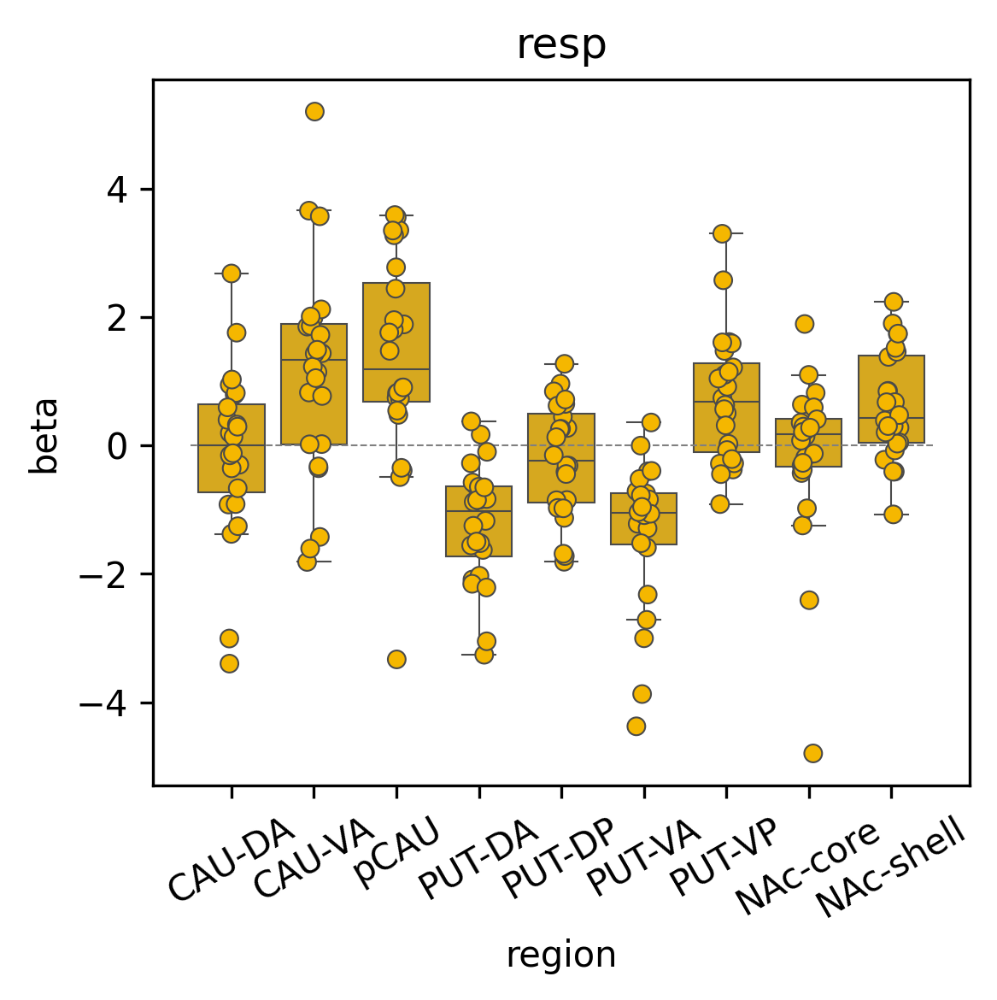

In [41]:
fig, ax = plt.subplots(1, 1, figsize=(4,4), dpi=300)
#yrange = [-3, 3]

sns.boxplot(data=roi_df_long.where(roi_df_long.participant_group=='non-Mandarin'), 
              x='region', y='beta', 
              #hue='hemisphere',
              #palette=['#fdb863','#b2abd2'],
              palette=['#F5B700'],
              linewidth=0.5,
              fliersize = 0,
              legend=None,
              ax=ax);
sns.stripplot(data=roi_df_long.where(roi_df_long.participant_group=='non-Mandarin'), 
              x='region', y='beta', 
              #hue='hemisphere',
              #palette=['#e66101','#5e3c99'],
              #dodge=True,
              palette=['#F5B700'],
              linewidth=0.5,
              ax=ax);
xmin, xmax = ax.get_xlim()
ax.hlines(y=0, xmin=xmin, xmax=xmax, color='0.5', linestyle='--', linewidth=0.5)
#ax.set_ylim(yrange)
ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='center')
#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
ax.set_title(f'{contrast_label}');

'''
# OUT OF DATE
# MANUAL SIGNIFICANCE MARKS (see statistics above – not ordered the same as here)
plt.text(3 -0.25, 3, '*')
plt.text(5 -0.25, 3, '*')
plt.text(10-0.25, 3, '*')
plt.text(5 +0.25, 3, '*')
'''
fig.tight_layout()


#### Compare groups

/scratch/slurm-3838180/ipykernel_38924/2982843957.py:19: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=30, ha='center')
/scratch/slurm-3838180/ipykernel_38924/2982843957.py:39: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=30, ha='center')


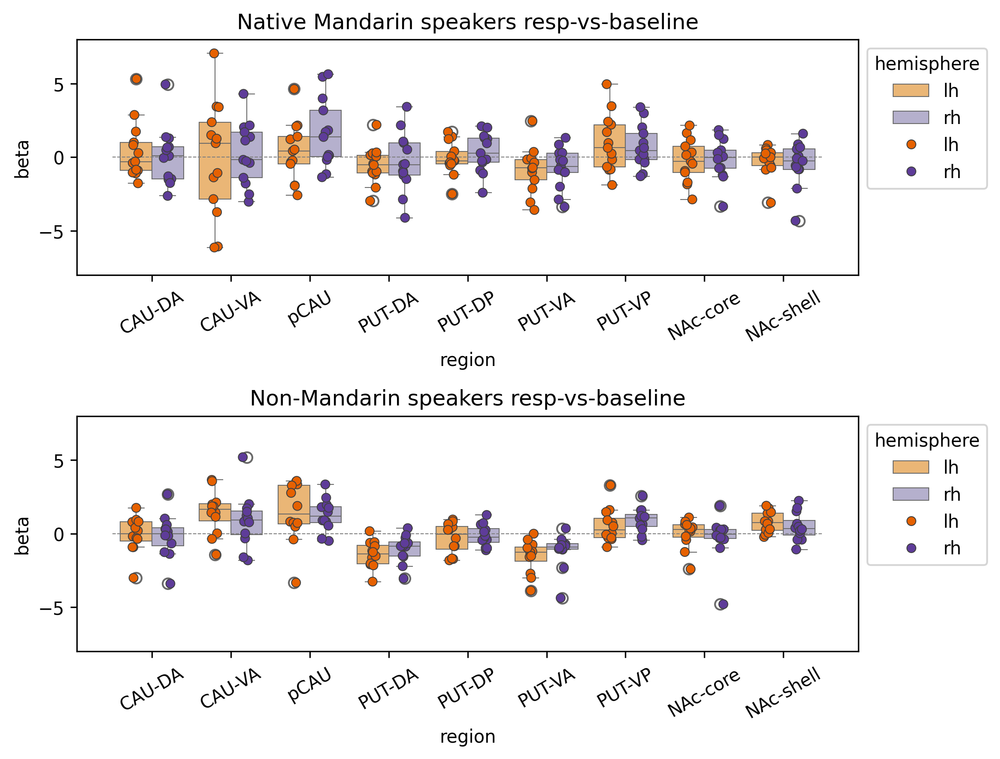

In [42]:
fig, ax = plt.subplots(2, 1, figsize=(8,6), dpi=300)
yrange = [-8, 8]
sns.boxplot(data=roi_df_long.where(roi_df_long.participant_group=='Mandarin'), 
              x='region', y='beta', 
              hue='hemisphere',
              palette=['#fdb863','#b2abd2'],
              linewidth=0.5,
              ax=ax[0]);
sns.stripplot(data=roi_df_long.where(roi_df_long.participant_group=='Mandarin'), 
              x='region', y='beta', 
              hue='hemisphere',
              palette=['#e66101','#5e3c99'],
              dodge=True,
              linewidth=0.5,
              ax=ax[0]);
xmin, xmax = ax[0].get_xlim()
ax[0].hlines(y=0, xmin=xmin, xmax=xmax, color='0.5', linestyle='--', linewidth=0.5)
ax[0].set_ylim(yrange)
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=30, ha='center')
sns.move_legend(ax[0], "upper left", bbox_to_anchor=(1, 1))
ax[0].set_title(f'Native Mandarin speakers {contrast_label}-vs-baseline');

sns.boxplot(data=roi_df_long.where(roi_df_long.participant_group=='non-Mandarin'), 
              x='region', y='beta', 
              hue='hemisphere',
              palette=['#fdb863','#b2abd2'],
              linewidth=0.5,
              ax=ax[1]);
sns.stripplot(data=roi_df_long.where(roi_df_long.participant_group=='non-Mandarin'), 
              x='region', y='beta', 
              hue='hemisphere',
              palette=['#e66101','#5e3c99'],
              dodge=True,
              linewidth=0.5,
              ax=ax[1]);
xmin, xmax = ax[1].get_xlim()
ax[1].hlines(y=0, xmin=xmin, xmax=xmax, color='0.5', linestyle='--', linewidth=0.5)
ax[1].set_ylim(yrange)
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=30, ha='center')
sns.move_legend(ax[1], "upper left", bbox_to_anchor=(1, 1))
ax[1].set_title(f'Non-Mandarin speakers {contrast_label}-vs-baseline');

fig.tight_layout()


#### all participants

In [ ]:
fig, ax = plt.subplots(figsize=(8,3), dpi=300)
sns.boxplot(data=roi_df_long, 
              x='region', y='beta', 
              hue='hemisphere',
              palette=['#fdb863','#b2abd2'],
              #dodge=True,
              linewidth=0.5,
              ax=ax);
sns.stripplot(data=roi_df_long, 
              x='region', y='beta', 
              hue='hemisphere',
              palette=['#e66101','#5e3c99'],
              dodge=True,
              linewidth=0.5,
              ax=ax);
fig.suptitle('All participants')
ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='center')
ax.hlines(y=0, xmin=xmin, xmax=xmax, color='0.5', linestyle='--', linewidth=0.5)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

/scratch/slurm-3838180/ipykernel_38924/2035998056.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='center')


### Statistics

#### Within-group, combining hemispheres

In [ ]:
#### group = 'non-Mandarin'
#for group in np.unique(roi_df.participant_group):
p_vals = []
t_stats = []
print('\nFDR-adjusted statistics')
for roi in np.unique(roi_df_long.region):
    groi_data = roi_df_long.where(roi_df_long.region==roi).where(roi_df_long.participant_group==group).dropna().beta
    res = stats.ttest_1samp(groi_data, popmean=0)
    #print(f't = {res.statistic:.02f} p = {res.pvalue:.04f} region = {roi}')
    p_vals.append(res.pvalue)
    t_stats.append(res.statistic)
p_vals_adj = stats.false_discovery_control(p_vals)
for rx, roi in enumerate(np.unique(roi_df_long.region)):
    if p_vals_adj[rx] < 0.05:
        ast = '**'
    elif p_vals[rx] < 0.05:
        ast = ' *'
    else:
        ast = '  '
    print(f'{ast}t = {t_stats[rx]:.02f} FDR-corr p = {p_vals_adj[rx]:.04f} uncorr p = {p_vals[rx]:.04f} region = {roi}')

#### Table of results

In [ ]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
res_df = pd.DataFrame(columns=['Region of interest', 't-statistic', 'p-value'])
res_df['t-statistic'] = t_stats
res_df['p-value'] = p_vals_adj
#res_df['p-value (FDR-corrected)'].map('{:,.2f}'.format)
res_df['Region of interest'] = np.unique(roi_df_long.region)

res_df

#### Within-group significance

In [28]:
group = 'non-Mandarin'
for group in np.unique(roi_df.participant_group):
    p_vals = []
    t_stats = []
    print(f'\ngroup = {group}')
    print('\nFDR-adjusted statistics')
    for roi in region_list:
        groi_data = roi_df.where(roi_df.participant_group==group).dropna()[roi]
        res = stats.ttest_1samp(groi_data, popmean=0)
        #print(f't = {res.statistic:.02f} p = {res.pvalue:.04f} region = {roi}')
        p_vals.append(res.pvalue)
        t_stats.append(res.statistic)
    p_vals_adj = stats.false_discovery_control(p_vals)
    for rx, roi in enumerate(region_list):
        if p_vals_adj[rx] < 0.05:
            ast = '*'
        else:
            ast = ' '
        print(f'{ast}t = {t_stats[rx]:.02f} p = {p_vals_adj[rx]:.04f} region = {roi}')


group = Mandarin

FDR-adjusted statistics
 t = 0.80 p = 0.7592 region = CAU-DA-lh
 t = 0.11 p = 0.9297 region = CAU-DA-rh
 t = -0.09 p = 0.9297 region = CAU-VA-lh
 t = 0.41 p = 0.8800 region = CAU-VA-rh
 t = 0.69 p = 0.7592 region = pCAU-lh
 t = 2.46 p = 0.3054 region = pCAU-rh
 t = -1.60 p = 0.3169 region = PUT-DA-lh
 t = -0.63 p = 0.7592 region = PUT-DA-rh
 t = -0.28 p = 0.9117 region = PUT-DP-lh
 t = 0.85 p = 0.7592 region = PUT-DP-rh
 t = -1.97 p = 0.3054 region = PUT-VA-lh
 t = -1.91 p = 0.3054 region = PUT-VA-rh
 t = 1.73 p = 0.3054 region = PUT-VP-lh
 t = 1.74 p = 0.3054 region = PUT-VP-rh

group = non-Mandarin

FDR-adjusted statistics
 t = -0.18 p = 0.8566 region = CAU-DA-lh
 t = -0.38 p = 0.7676 region = CAU-DA-rh
*t = 3.37 p = 0.0132 region = CAU-VA-lh
 t = 1.67 p = 0.1768 region = CAU-VA-rh
 t = 2.45 p = 0.0564 region = pCAU-lh
*t = 3.94 p = 0.0091 region = pCAU-rh
*t = -5.40 p = 0.0031 region = PUT-DA-lh
*t = -3.73 p = 0.0093 region = PUT-DA-rh
 t = -1.06 p = 0.3955 region

#### plot on brain

In [29]:
from nilearn.image import new_img_like
from nilearn import plotting

In [30]:
roi_stat_data_list = []
for rx, rpath in enumerate(mask_path_list):
    roi_img = nib.load(rpath)
    roi_data = roi_img.get_fdata()
    
    roi_stat = t_stats[rx]
    roi_stat_data = roi_data * roi_stat
    
    roi_stat_data_list.append(roi_stat_data)

# add maps together and make nifti img
roi_stat_map_data = sum(roi_stat_data_list)
roi_stat_map_img = new_img_like(roi_img, roi_stat_map_data)

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/img_plotting.py:300: FutureWarning: Default resolution of the MNI template will change from 2mm to 1mm in version 0.10.0
  anat_img = load_mni152_template()


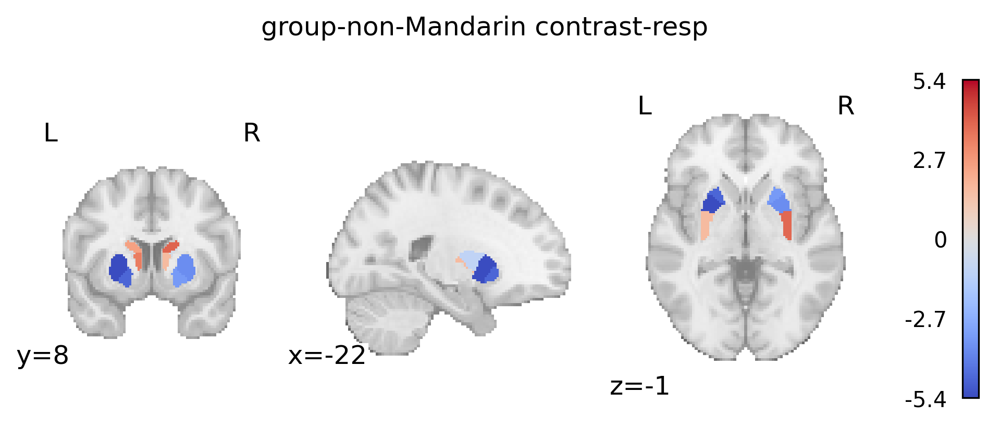

In [31]:
title = f'group-{group} contrast-{contrast_label}'
fig, ax = plt.subplots(figsize=(8,3), dpi=300)
plotting.plot_stat_map(roi_stat_map_img,
                       cmap='coolwarm',
                       draw_cross=False,
                       axes=ax)
fig.suptitle(title);

## Make 3D plots

In [31]:
mask_dict = dict(zip(mask_path_list, 
                     range(1,len(mask_path_list)+1)))

In [32]:
mask_dict

{'/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/masks/sub-FLT30/space-MNI152NLin2009cAsym/masks-tian-S3/sub-FLT30_space-MNI152NLin2009cAsym_mask-CAU-DA-lh.nii.gz': 1,
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/masks/sub-FLT30/space-MNI152NLin2009cAsym/masks-tian-S3/sub-FLT30_space-MNI152NLin2009cAsym_mask-CAU-DA-rh.nii.gz': 2,
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/masks/sub-FLT30/space-MNI152NLin2009cAsym/masks-tian-S3/sub-FLT30_space-MNI152NLin2009cAsym_mask-CAU-VA-lh.nii.gz': 3,
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/masks/sub-FLT30/space-MNI152NLin2009cAsym/masks-tian-S3/sub-FLT30_space-MNI152NLin2009cAsym_mask-CAU-VA-rh.nii.gz': 4,
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/masks/sub-FLT30/space-MNI152NLin2009cAsym/masks-tian-S3/sub-FLT30_space-MNI152NLin2009cAsym_mask-pCAU-lh.nii.gz': 5,
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivat

In [33]:
stat_dict = dict(zip(range(1,len(t_stats)+1), 
                     t_stats))

In [34]:
stat_dict

{1: -0.18494235450787397,
 2: -0.3777587133424012,
 3: 3.3735567090271554,
 4: 1.6650948480418757,
 5: 2.4507954103959673,
 6: 3.943253275393801,
 7: -5.395980900000361,
 8: -3.733204704343147,
 9: -1.0625394472500334,
 10: -0.5507298186713104,
 11: -4.747314537992013,
 12: -3.3412259361970964,
 13: 1.6544276780627765,
 14: 3.8689084605727038}

In [40]:
from matplotlib import cm

# Load NIfTI files into a list
nifti_files = mask_path_list

# Define a colormap
colormap = cm.get_cmap('coolwarm')

# Define the list of values for color plotting
color_values = t_stats  # Adjust these values as needed

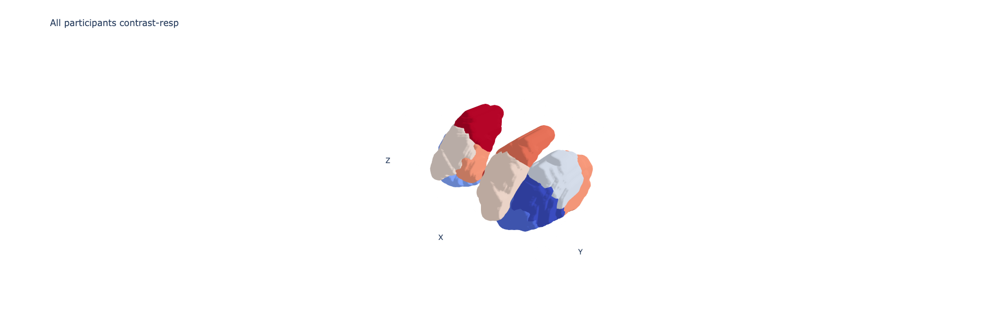

In [32]:
import numpy as np
import nibabel as nib
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from matplotlib import cm
from skimage import measure
from scipy.ndimage import gaussian_filter

# Load NIfTI files into a list
nifti_files = mask_path_list

# Define a colormap
colormap = cm.get_cmap('coolwarm')

# Define the list of values for color plotting
color_values = t_stats  # Adjust these values as needed

# Create a list to hold the data for each segmentation
segmentations = []

# Loop through each NIfTI file and extract segmentation data
for nifti_file in nifti_files:
    nifti_data = nib.load(nifti_file)
    segmentation = nifti_data.get_fdata()
    segmentations.append(segmentation)

# Combine all segmentations into a single binary mask
combined_segmentation = np.any(segmentations, axis=0)

# Upsample the voxel data to a higher resolution grid
upsampled_segmentation = np.repeat(np.repeat(np.repeat(combined_segmentation, 2, axis=0), 2, axis=1), 2, axis=2)

# Smooth the upsampled voxel data with a Gaussian filter
smoothed_segmentation = gaussian_filter(upsampled_segmentation, sigma=1)

# Extract the surface mesh of the smoothed segmented region with adjusted level
vertices, faces, _, _ = measure.marching_cubes(smoothed_segmentation, level=smoothed_segmentation.mean())

# Translate vertices closer to the origin
center = vertices.mean(axis=0)
vertices -= center

# Create a subplot for the 3D plot with a larger size
fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'mesh3d'}]], print_grid=False)

# Loop through each segmentation and add its surface plot to the subplot
for i, segmentation in enumerate(segmentations):
    # Upsample the voxel data to a higher resolution grid
    upsampled_segmentation = np.repeat(np.repeat(np.repeat(segmentation, 2, axis=0), 2, axis=1), 2, axis=2)
    
    # Smooth the upsampled voxel data with a Gaussian filter
    smoothed_segmentation = gaussian_filter(upsampled_segmentation, sigma=1)
    
    # Extract the surface mesh of the smoothed segmented region with adjusted level
    vertices, faces, _, _ = measure.marching_cubes(smoothed_segmentation, level=smoothed_segmentation.mean())
    
    vertices -= center
    
    # Map the color value to the colormap
    colormap_value = (color_values[i] - min(color_values)) / (max(color_values) - min(color_values))
    color = colormap(colormap_value)
    
    # Add the surface plot to the subplot
    fig.add_trace(go.Mesh3d(
        x=vertices[:, 0],
        y=vertices[:, 1],
        z=vertices[:, 2],
        i=faces[:, 0],
        j=faces[:, 1],
        k=faces[:, 2],
        color=f'rgb({int(color[0]*255)}, {int(color[1]*255)}, {int(color[2]*255)})',
        opacity=1,
        name= region_list[i] # f'Segmentation {i+1}'
    ))

# Set starting camera angle
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=0, y=0, z=0),
    eye=dict(x=-1.25, y=1.25, z=1.25)
)

# Update layout for the 3D plot to set a larger size and transparent background
fig.update_layout(
    scene=dict(
        xaxis=dict(title='X', showbackground=False, linecolor='rgba(0,0,0,0)', showticklabels=False),
        yaxis=dict(title='Y', showbackground=False, linecolor='rgba(0,0,0,0)', showticklabels=False),
        zaxis=dict(title='Z', showbackground=False, linecolor='rgba(0,0,0,0)', showticklabels=False),
        bgcolor='rgba(0,0,0,0)',  # Set background color to transparent
        camera=camera  # Set starting camera angle
    ),
    title=f'All participants contrast-{contrast_label}',
    width=800,  # Set width of the plot
    height=600,  # Set height of the plot
)

'''
# Add XYZ axis legends closer to the surfaces
axis_length = 10  # Adjust the length of the axis lines
text_offset = 5  # Adjust the offset for text position

fig.add_trace(go.Scatter3d(
    x=[0, axis_length],
    y=[0, 0],
    z=[0, 0],
    mode='lines+text',
    line=dict(color='black', width=4),
    text=['X', ''],
    textposition='middle center',
    showlegend=False
))

fig.add_trace(go.Scatter3d(
    x=[0, 0],
    y=[0, axis_length],
    z=[0, 0],
    mode='lines+text',
    line=dict(color='black', width=4),
    text=['', 'Y'],
    textposition='middle center',
    showlegend=False
))

fig.add_trace(go.Scatter3d(
    x=[0, 0],
    y=[0, 0],
    z=[0, axis_length],
    mode='lines+text',
    line=dict(color='black', width=4),
    text=['', '', 'Z'],
    textposition='middle center',
    showlegend=False
))
'''

# Show the interactive plot
fig.show()

# Save the interactive plot as an SVG file
fig.write_image(f'out-figure_group-all_contrast-{contrast_label}_surface.svg')

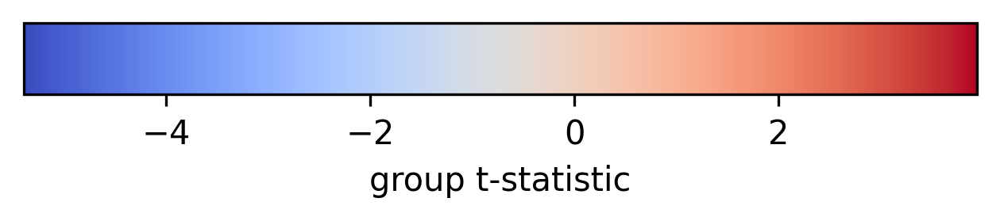

In [33]:
a = np.array([[min(color_values), max(color_values)]])
plt.figure(figsize=(5, 0.5), dpi=300)
img = plt.imshow(a, cmap=colormap)
plt.gca().set_visible(False)
cax = plt.axes([0.1, 0.2, 0.8, 0.6])
cbar = plt.colorbar(orientation="horizontal", cax=cax, label='group t-statistic')
cbar.ax.get_yaxis().labelpad = 15
#pl.savefig("colorbar.pdf")

In [40]:
import numpy as np
import nibabel as nib

def combine_segmentations(segmentation_files, label_values):
    """
    Combines multiple segmentation NIfTI files into a single segmentation atlas with different label values.
    
    Parameters:
        segmentation_files (dict): Dictionary mapping file paths to label values.
        label_values (dict): Dictionary mapping label values to statistical values.
    
    Returns:
        numpy.ndarray: Combined segmentation atlas.
    """
    # Load first segmentation to get shape and initialize the atlas
    first_seg = nib.load(list(segmentation_files.keys())[0])
    atlas_data = np.zeros(first_seg.shape, dtype=float)
    
    # Combine segmentation data from each file
    for seg_file, label_value in segmentation_files.items():
        seg_data = nib.load(seg_file).get_fdata()
        atlas_data[seg_data > 0] = label_value
    
    return atlas_data

# Combine segmentations into a single atlas
atlas = combine_segmentations(mask_dict, stat_dict)

In [41]:
np.unique(atlas)

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14.])

# Early vs. late runs (thirds)

In [74]:
# get the beta map for the contrast of interest for each subject
l1_fnames_firsthalf = [sorted(glob(l1_dir+'/%s_space-%s/grouped_runs/firsthalf/*%s_map-beta.nii.gz'%(sub_id, space_label, contrast_label)))[0] for sub_id in subjects_label]
l1_fnames_secondhalf = [sorted(glob(l1_dir+'/%s_space-%s/grouped_runs/secondhalf/*%s_map-beta.nii.gz'%(sub_id, space_label, contrast_label)))[0] for sub_id in subjects_label]

#l1_fnames_mand = [sorted(glob(l1_dir+'/%s_space-%s/grouped_runs/*%s_map-beta.nii.gz'%(sub_id, space_label, contrast_label)))[0] for sub_id in sub_list_mand]
#l1_fnames_nman = [sorted(glob(l1_dir+'/%s_space-%s/grouped_runs/*%s_map-beta.nii.gz'%(sub_id, space_label, contrast_label)))[0] for sub_id in sub_list_nman]

In [75]:
l1_fnames_firsthalf

['/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-1_fwhm-0.00/sub-FLT02_space-MNI152NLin2009cAsym/grouped_runs/firsthalf/sub-FLT02_task-tonecat_fwhm-0.00_space-MNI152NLin2009cAsym_contrast-sound_map-beta.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-1_fwhm-0.00/sub-FLT03_space-MNI152NLin2009cAsym/grouped_runs/firsthalf/sub-FLT03_task-tonecat_fwhm-0.00_space-MNI152NLin2009cAsym_contrast-sound_map-beta.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-1_fwhm-0.00/sub-FLT04_space-MNI152NLin2009cAsym/grouped_runs/firsthalf/sub-FLT04_task-tonecat_fwhm-0.00_space-MNI152NLin2009cAsym_contrast-sound_map-beta.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-1_fwhm-0.00/sub-FLT05_space-MNI152NLin2009cAsym/grouped_runs/firsthalf/sub-FLT05_task-tonecat_fwhm-0.00_space-MNI152NLin2009cAsym_contrast-sound_map-beta.nii.gz',
 '/bgfs/bchandrasekaran/krs2

## Mask stat maps

In [76]:
roi_firsthalf_mean_dict = {}
roi_secondhalf_mean_dict = {}
for rx, region in enumerate(region_list):
    print(region)
    
    roi_firsthalf_mean_list = []
    for fx, stat_fpath in enumerate(l1_fnames_firsthalf):
        sub_id = subjects_label[fx]
        mask_fpath = glob(masks_dir + f'/{sub_id}/space-MNI152NLin2009cAsym/masks-*/*{region}*.nii.gz')[0]
        
        masked_data = apply_mask(stat_fpath, mask_fpath)
        roi_mean_sub = masked_data.mean()
        
        roi_firsthalf_mean_list.append(roi_mean_sub)
        
    roi_firsthalf_mean_dict[region] = roi_firsthalf_mean_list
    
    roi_secondhalf_mean_list = []
    for fx, stat_fpath in enumerate(l1_fnames_secondhalf):
        sub_id = subjects_label[fx]
        mask_fpath = glob(masks_dir + f'/{sub_id}/space-MNI152NLin2009cAsym/masks-*/*{region}*.nii.gz')[0]
        
        masked_data = apply_mask(stat_fpath, mask_fpath)
        roi_mean_sub = masked_data.mean()
        
        roi_secondhalf_mean_list.append(roi_mean_sub)
        
    roi_secondhalf_mean_dict[region] = roi_secondhalf_mean_list

CAU-DA-lh
CAU-VA-lh
pCAU-lh
PUT-DA-lh
PUT-DP-lh
PUT-VA-lh
PUT-VP-lh
aGP-lh
pGP-lh
NAc-core-lh
NAc-shell-lh
CAU-DA-rh
CAU-VA-rh
pCAU-rh
PUT-DA-rh
PUT-DP-rh
PUT-VA-rh
PUT-VP-rh
aGP-rh
pGP-rh
NAc-core-rh
NAc-shell-rh


In [77]:
roi_firsthalf_df = pd.DataFrame.from_dict(roi_firsthalf_mean_dict)
roi_secondhalf_df = pd.DataFrame.from_dict(roi_secondhalf_mean_dict)


roi_firsthalf_df['participant_id'] = participants_df.participant_id
roi_firsthalf_df['participant_group'] = participants_df.group
roi_secondhalf_df['participant_id'] = participants_df.participant_id
roi_secondhalf_df['participant_group'] = participants_df.group

In [78]:
roi_firsthalf_df

,CAU-DA-lh,CAU-VA-lh,pCAU-lh,PUT-DA-lh,PUT-DP-lh,PUT-VA-lh,PUT-VP-lh,aGP-lh,pGP-lh,NAc-core-lh,...,PUT-DA-rh,PUT-DP-rh,PUT-VA-rh,PUT-VP-rh,aGP-rh,pGP-rh,NAc-core-rh,NAc-shell-rh,participant_id,participant_group
0,-0.877418,-2.353567,-2.112723,3.099398,3.350884,1.801447,2.892395,-0.751484,0.029585,0.039993,...,1.673669,0.789249,1.795705,1.356492,-0.024613,-0.591356,2.193460,-0.432064,sub-FLT02,non-Mandarin
1,-4.947215,-14.955313,-5.636708,2.492965,4.317638,2.356896,5.319517,-0.708577,-3.855043,0.784947,...,0.382773,0.032542,0.250132,2.458073,-0.405214,-0.746313,0.563989,-1.210476,sub-FLT03,Mandarin
2,8.731088,4.475423,8.927271,5.074497,4.603926,5.192119,3.528870,1.022212,-0.831762,4.379189,...,5.177123,3.900652,6.909743,1.382616,-0.330406,1.041561,16.115484,4.450343,sub-FLT04,non-Mandarin
3,4.013030,0.465366,1.074552,-0.005386,0.230321,0.223718,-0.796938,-1.639352,0.133069,3.195083,...,-1.820574,0.318961,-1.231519,3.695215,0.062777,1.507277,0.203982,1.142771,sub-FLT05,Mandarin
4,5.299811,1.522104,2.602619,4.379911,2.320021,4.801640,1.610549,1.382437,0.247023,4.543538,...,2.643136,1.823349,4.567939,1.511004,1.003003,2.665666,5.018704,1.230017,sub-FLT06,non-Mandarin
5,2.340185,-0.630083,-1.354034,0.799063,-0.661501,-2.360149,-4.013899,-1.244830,-2.564030,-0.795805,...,-0.225566,-0.247838,-1.035672,0.007762,1.131253,0.467047,-0.161076,-0.473431,sub-FLT08,Mandarin
6,3.974546,2.917191,4.102835,5.450889,2.759817,4.272260,0.684715,-1.249079,0.627045,1.791126,...,5.538332,0.571005,3.910082,-0.259895,-0.561105,-3.538762,2.052422,1.936894,sub-FLT09,non-Mandarin
7,-0.185762,-1.871180,0.956696,2.883979,0.935347,1.302673,-2.165443,0.458930,-0.636969,-3.173994,...,0.620591,0.045156,-0.498631,-1.311497,-0.448823,0.257701,-1.796443,0.116816,sub-FLT10,Mandarin
8,2.066886,4.644421,4.131763,7.989376,4.319916,5.781088,3.378295,3.405533,1.555685,4.698967,...,8.258861,3.406859,6.125955,3.081991,2.914709,2.656749,2.623969,2.118790,sub-FLT11,non-Mandarin
9,3.043989,0.917685,-0.319191,3.256735,1.049893,5.335629,-0.737314,1.453611,-0.360007,3.150993,...,2.610439,1.074812,3.747700,-1.618703,0.193887,0.989855,2.872547,2.494816,sub-FLT12,non-Mandarin


In [79]:
roi_secondhalf_df

,CAU-DA-lh,CAU-VA-lh,pCAU-lh,PUT-DA-lh,PUT-DP-lh,PUT-VA-lh,PUT-VP-lh,aGP-lh,pGP-lh,NAc-core-lh,...,PUT-DA-rh,PUT-DP-rh,PUT-VA-rh,PUT-VP-rh,aGP-rh,pGP-rh,NAc-core-rh,NAc-shell-rh,participant_id,participant_group
0,0.758556,4.763519,-1.393321,7.619069,3.849474,12.502820,1.732721,0.294290,-0.213645,5.776931,...,6.984324,2.869348,7.378480,-0.689232,-0.105304,-3.899299,9.704620,3.028427,sub-FLT02,non-Mandarin
1,-5.651607,0.714061,-3.957480,6.668160,1.292126,7.926043,1.709217,0.995350,-0.850036,1.659153,...,1.684192,0.090994,6.029802,2.367745,-3.051105,-7.966575,1.752240,-0.897455,sub-FLT03,Mandarin
2,4.195756,8.203376,10.633531,4.484552,1.494709,6.536311,1.466516,-0.183630,-0.201159,7.236316,...,3.476337,0.071368,8.762651,0.718249,2.080979,0.794372,9.671801,3.510923,sub-FLT04,non-Mandarin
3,6.271263,30.746241,7.817287,-2.605594,0.004127,2.268768,-7.641412,0.037875,-8.892057,4.263633,...,-1.856867,2.026274,4.185187,3.749474,-0.327259,4.238859,2.739069,6.870577,sub-FLT05,Mandarin
4,1.110893,2.228994,1.811656,3.833954,2.458127,3.478788,2.010455,0.349612,-0.649121,1.756229,...,2.571169,1.677436,2.108648,1.360139,-0.003153,0.750645,2.232259,1.345310,sub-FLT06,non-Mandarin
5,-1.466397,4.144239,1.777955,4.567031,3.987770,9.987865,9.180807,-1.961564,0.754351,-0.051729,...,4.662962,4.346115,0.979478,5.283207,-1.687312,1.468626,-2.568361,2.371144,sub-FLT08,Mandarin
6,3.425355,-0.501227,-2.541072,4.930550,-0.278228,2.286992,-3.254508,-0.397350,-2.088721,0.907953,...,3.221126,-0.248297,3.711057,-4.576452,-1.280159,-3.150292,2.238972,0.163242,sub-FLT09,non-Mandarin
7,-0.201803,-1.795250,-3.826520,-5.193797,-4.449549,-7.431989,-3.942736,-0.376218,-0.725836,-3.347537,...,-3.778762,-2.926937,-1.324766,-7.079391,-0.081691,-3.397104,-2.627163,-0.502973,sub-FLT10,Mandarin
8,-1.434119,0.250916,1.306101,5.014879,4.298380,7.465771,-0.418956,4.046861,2.282364,2.324183,...,4.667401,2.411401,3.399295,0.706652,2.269125,-1.127619,0.709534,3.018669,sub-FLT11,non-Mandarin
9,-4.571238,-6.954232,-10.718322,-1.011998,-0.659582,-1.459740,-2.232714,-1.812276,-0.344498,-1.965825,...,0.876162,0.520975,-0.464709,-1.571501,-0.535501,1.369237,-1.364951,-0.428335,sub-FLT12,non-Mandarin


In [94]:
roi_firsthalf_df_long = roi_firsthalf_df.melt(id_vars=["participant_id", "participant_group", ], 
                                              var_name="region", value_name="beta")
roi_firsthalf_df_long['data_split'] = 'first_half'

roi_secondhalf_df_long = roi_secondhalf_df.melt(id_vars=["participant_id", "participant_group"], 
                                               var_name="region", value_name="beta")
roi_secondhalf_df_long['data_split'] = 'second_half'

if network_name == 'auditory':
    roi_firsthalf_df_long['hemisphere'] = roi_firsthalf_df_long.region.str[0]
    roi_firsthalf_df_long['region'] = roi_firsthalf_df_long.region.str[2:]
    roi_secondhalf_df_long['hemisphere'] = roi_secondhalf_df_long.region.str[0]
    roi_secondhalf_df_long['region'] = roi_secondhalf_df_long.region.str[2:]
elif network_name == 'tian_subcortical_S3':
    roi_firsthalf_df_long['hemisphere'] = roi_firsthalf_df_long.region.str[-2:]
    roi_firsthalf_df_long['region'] = roi_firsthalf_df_long.region.str[:-3]
    roi_secondhalf_df_long['hemisphere'] = roi_secondhalf_df_long.region.str[-2:]
    roi_secondhalf_df_long['region'] = roi_secondhalf_df_long.region.str[:-3]

In [95]:
roi_df_long = pd.concat([roi_firsthalf_df_long, roi_secondhalf_df_long],)


In [96]:
roi_df_long

,participant_id,participant_group,region,beta,data_split,hemisphere
0,sub-FLT02,non-Mandarin,CAU-DA,-0.877418,first_half,lh
1,sub-FLT03,Mandarin,CAU-DA,-4.947215,first_half,lh
2,sub-FLT04,non-Mandarin,CAU-DA,8.731088,first_half,lh
3,sub-FLT05,Mandarin,CAU-DA,4.013030,first_half,lh
4,sub-FLT06,non-Mandarin,CAU-DA,5.299811,first_half,lh
...,...,...,...,...,...,...
545,sub-FLT24,Mandarin,NAc-shell,4.709452,second_half,rh
546,sub-FLT25,non-Mandarin,NAc-shell,-0.623834,second_half,rh
547,sub-FLT26,Mandarin,NAc-shell,0.168503,second_half,rh
548,sub-FLT28,non-Mandarin,NAc-shell,0.689938,second_half,rh


### Compare groups

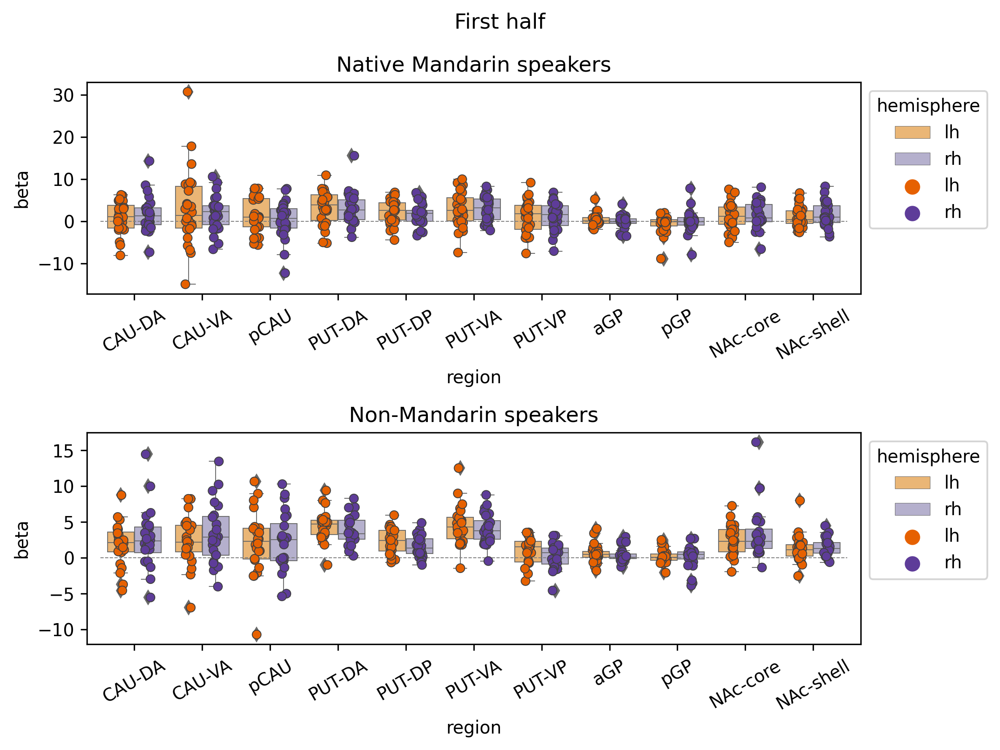

In [97]:
fig, ax = plt.subplots(2, 1, figsize=(8,6), dpi=300)
fig.suptitle('First half')

sns.boxplot(data=roi_df_long.where(roi_firsthalf_df_long.participant_group=='Mandarin'), 
              x='region', y='beta', 
              hue='hemisphere',
              palette=['#fdb863','#b2abd2'],
              linewidth=0.5,
              ax=ax[0]);
sns.stripplot(data=roi_df_long.where(roi_firsthalf_df_long.participant_group=='Mandarin'), 
              x='region', y='beta', 
              hue='hemisphere',
              palette=['#e66101','#5e3c99'],
              dodge=True,
              linewidth=0.5,
              ax=ax[0]);
xmin, xmax = ax[0].get_xlim()
ax[0].hlines(y=0, xmin=xmin, xmax=xmax, color='0.5', linestyle='--', linewidth=0.5)
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=30, ha='center')
sns.move_legend(ax[0], "upper left", bbox_to_anchor=(1, 1))
ax[0].set_title('Native Mandarin speakers');

sns.boxplot(data=roi_df_long.where(roi_firsthalf_df_long.participant_group=='non-Mandarin'), 
              x='region', y='beta', 
              hue='hemisphere',
              palette=['#fdb863','#b2abd2'],
              linewidth=0.5,
              ax=ax[1]);
sns.stripplot(data=roi_df_long.where(roi_firsthalf_df_long.participant_group=='non-Mandarin'), 
              x='region', y='beta', 
              hue='hemisphere',
              palette=['#e66101','#5e3c99'],
              dodge=True,
              linewidth=0.5,
              ax=ax[1]);
xmin, xmax = ax[1].get_xlim()
ax[1].hlines(y=0, xmin=xmin, xmax=xmax, color='0.5', linestyle='--', linewidth=0.5)
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=30, ha='center')
sns.move_legend(ax[1], "upper left", bbox_to_anchor=(1, 1))
ax[1].set_title('Non-Mandarin speakers');

fig.tight_layout()


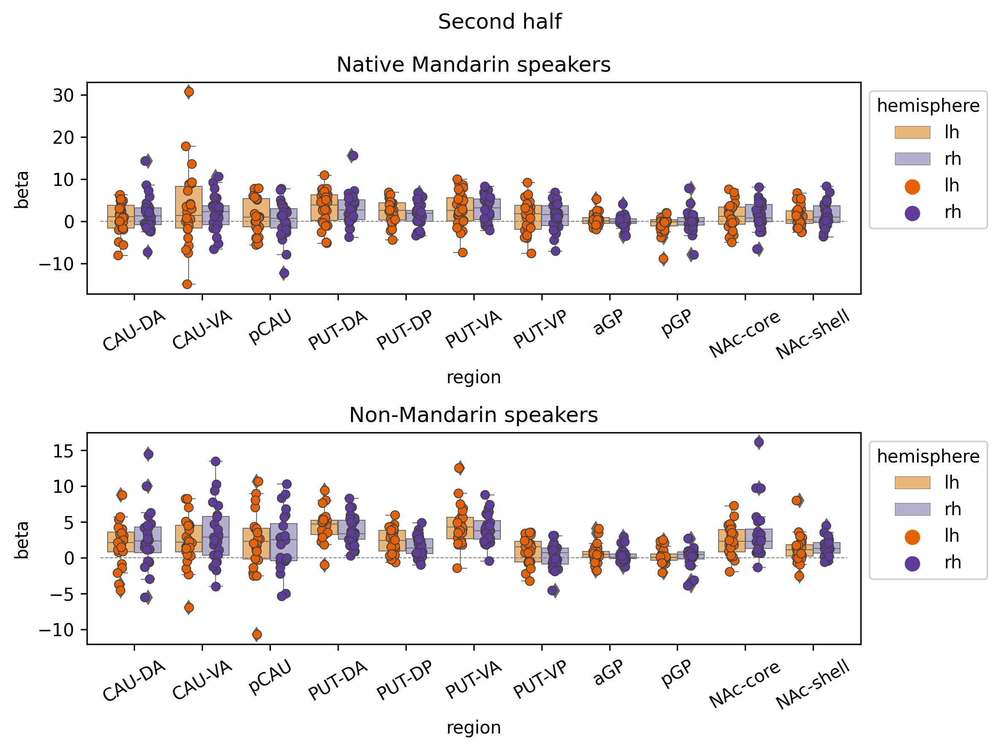

In [98]:
fig, ax = plt.subplots(2, 1, figsize=(8,6), dpi=300)
fig.suptitle('Second half')

sns.boxplot(data=roi_df_long.where(roi_secondhalf_df_long.participant_group=='Mandarin'), 
              x='region', y='beta', 
              hue='hemisphere',
              palette=['#fdb863','#b2abd2'],
              linewidth=0.5,
              ax=ax[0]);
sns.stripplot(data=roi_df_long.where(roi_secondhalf_df_long.participant_group=='Mandarin'), 
              x='region', y='beta', 
              hue='hemisphere',
              palette=['#e66101','#5e3c99'],
              dodge=True,
              linewidth=0.5,
              ax=ax[0]);
xmin, xmax = ax[0].get_xlim()
ax[0].hlines(y=0, xmin=xmin, xmax=xmax, color='0.5', linestyle='--', linewidth=0.5)
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=30, ha='center')
sns.move_legend(ax[0], "upper left", bbox_to_anchor=(1, 1))
ax[0].set_title('Native Mandarin speakers');

sns.boxplot(data=roi_df_long.where(roi_secondhalf_df_long.participant_group=='non-Mandarin'), 
              x='region', y='beta', 
              hue='hemisphere',
              palette=['#fdb863','#b2abd2'],
              linewidth=0.5,
              ax=ax[1]);
sns.stripplot(data=roi_df_long.where(roi_secondhalf_df_long.participant_group=='non-Mandarin'), 
              x='region', y='beta', 
              hue='hemisphere',
              palette=['#e66101','#5e3c99'],
              dodge=True,
              linewidth=0.5,
              ax=ax[1]);
xmin, xmax = ax[1].get_xlim()
ax[1].hlines(y=0, xmin=xmin, xmax=xmax, color='0.5', linestyle='--', linewidth=0.5)
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=30, ha='center')
sns.move_legend(ax[1], "upper left", bbox_to_anchor=(1, 1))
ax[1].set_title('Non-Mandarin speakers');

fig.tight_layout()


### all participants

[Text(0, 0, 'CAU-DA'),
 Text(1, 0, 'CAU-VA'),
 Text(2, 0, 'pCAU'),
 Text(3, 0, 'PUT-DA'),
 Text(4, 0, 'PUT-DP'),
 Text(5, 0, 'PUT-VA'),
 Text(6, 0, 'PUT-VP'),
 Text(7, 0, 'aGP'),
 Text(8, 0, 'pGP'),
 Text(9, 0, 'NAc-core'),
 Text(10, 0, 'NAc-shell')]

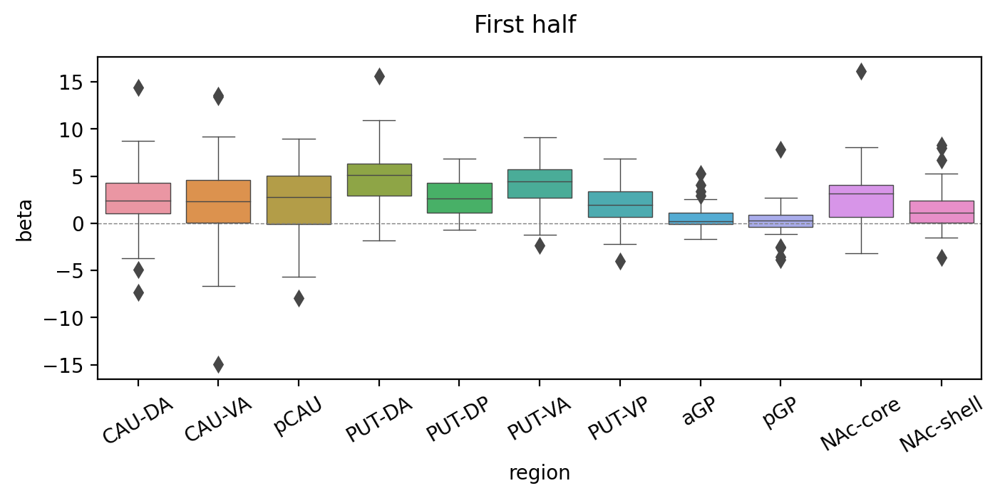

In [99]:
fig, ax = plt.subplots(figsize=(8,3), dpi=200)
fig.suptitle('First half')
sns.boxplot(data=roi_firsthalf_df_long, 
              x='region', y='beta', 
              #hue='participant_group',
              #palette=['#0571b0','#ca0020'],
              #dodge=True,
              linewidth=0.5,
              ax=ax);
ax.hlines(y=0, xmin=xmin, xmax=xmax, color='0.5', linestyle='--', linewidth=0.5)

ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='center')
#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

[Text(0, 0, 'CAU-DA'),
 Text(1, 0, 'CAU-VA'),
 Text(2, 0, 'pCAU'),
 Text(3, 0, 'PUT-DA'),
 Text(4, 0, 'PUT-DP'),
 Text(5, 0, 'PUT-VA'),
 Text(6, 0, 'PUT-VP'),
 Text(7, 0, 'aGP'),
 Text(8, 0, 'pGP'),
 Text(9, 0, 'NAc-core'),
 Text(10, 0, 'NAc-shell')]

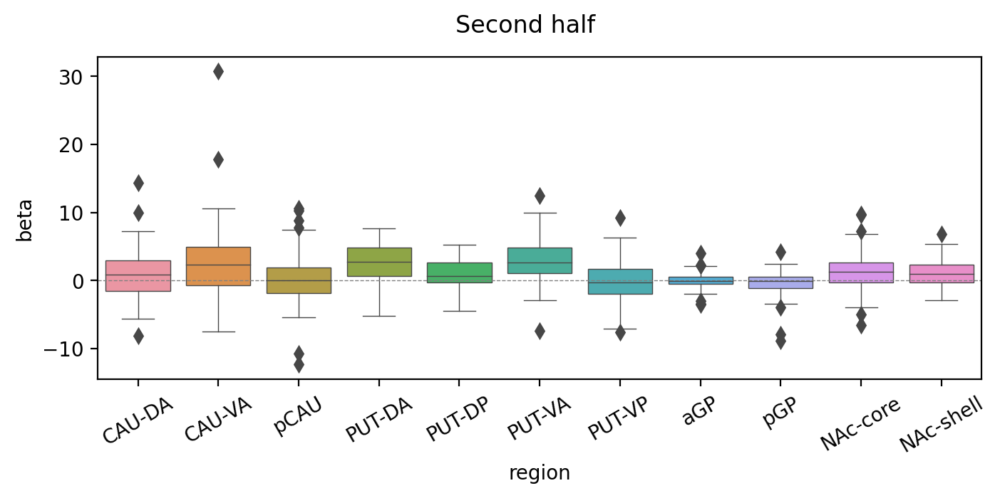

In [100]:
fig, ax = plt.subplots(figsize=(8,3), dpi=200)
fig.suptitle('Second half')
sns.boxplot(data=roi_secondhalf_df_long, 
              x='region', y='beta', 
              #hue='participant_group',
              #palette=['#0571b0','#ca0020'],
              #dodge=True,
              linewidth=0.5,
              ax=ax);
ax.hlines(y=0, xmin=xmin, xmax=xmax, color='0.5', linestyle='--', linewidth=0.5)
ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='center')
#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

### Statistics

#### Within-group differences between halves

In [107]:
p_vals = []
t_stats = []
print('Native Mandarin, first half vs. second half')
for roi in region_list:
    data1 = roi_firsthalf_df.where(roi_firsthalf_df.participant_group=='Mandarin').dropna()[roi]
    data2 = roi_secondhalf_df.where(roi_secondhalf_df.participant_group=='Mandarin').dropna()[roi]
    res = stats.ttest_ind(data1, data2)
    #print(f'p = {res.pvalue:.04f} t = {res.statistic:.02f} region = {roi}')
    p_vals.append(res.pvalue)
    t_stats.append(res.statistic)
    
p_vals_adj = stats.false_discovery_control(p_vals)

print('\nFDR-adjusted statistics')
for rx, roi in enumerate(region_list):
    print(f't = {t_stats[rx]:.02f} p = {p_vals_adj[rx]:.04f} region = {roi}')

Native Mandarin, first half vs. second half

FDR-adjusted statistics
t = 1.57 p = 0.2827 region = CAU-DA-lh
t = -0.50 p = 0.6790 region = CAU-VA-lh
t = 1.40 p = 0.2984 region = pCAU-lh
t = 2.47 p = 0.1228 region = PUT-DA-lh
t = 2.76 p = 0.1228 region = PUT-DP-lh
t = 0.68 p = 0.6582 region = PUT-VA-lh
t = 1.43 p = 0.2984 region = PUT-VP-lh
t = 1.36 p = 0.2984 region = aGP-lh
t = 0.62 p = 0.6582 region = pGP-lh
t = 1.25 p = 0.3261 region = NAc-core-lh
t = 0.66 p = 0.6582 region = NAc-shell-lh
t = 0.32 p = 0.7493 region = CAU-DA-rh
t = 0.48 p = 0.6790 region = CAU-VA-rh
t = 1.79 p = 0.2352 region = pCAU-rh
t = 1.90 p = 0.2195 region = PUT-DA-rh
t = 2.02 p = 0.2001 region = PUT-DP-rh
t = 1.35 p = 0.2984 region = PUT-VA-rh
t = 2.52 p = 0.1228 region = PUT-VP-rh
t = 2.37 p = 0.1228 region = aGP-rh
t = 1.64 p = 0.2773 region = pGP-rh
t = 2.34 p = 0.1228 region = NAc-core-rh
t = -0.46 p = 0.6790 region = NAc-shell-rh


In [108]:
p_vals = []
t_stats = []
print('Non-Mandarin, first half vs. second half')
for roi in region_list:
    data1 = roi_firsthalf_df.where(roi_firsthalf_df.participant_group=='non-Mandarin').dropna()[roi]
    data2 = roi_secondhalf_df.where(roi_secondhalf_df.participant_group=='non-Mandarin').dropna()[roi]
    res = stats.ttest_ind(data1, data2)
    #print(f'p = {res.pvalue:.04f} t = {res.statistic:.02f} region = {roi}')
    p_vals.append(res.pvalue)
    t_stats.append(res.statistic)
    
p_vals_adj = stats.false_discovery_control(p_vals)

print('\nFDR-adjusted statistics')
for rx, roi in enumerate(region_list):
    print(f't = {t_stats[rx]:.02f} p = {p_vals_adj[rx]:.04f} region = {roi}')

Non-Mandarin, first half vs. second half

FDR-adjusted statistics
t = 1.86 p = 0.3947 region = CAU-DA-lh
t = -0.08 p = 0.9392 region = CAU-VA-lh
t = 1.41 p = 0.4640 region = pCAU-lh
t = 1.66 p = 0.3947 region = PUT-DA-lh
t = 1.91 p = 0.3947 region = PUT-DP-lh
t = 0.79 p = 0.7154 region = PUT-VA-lh
t = 1.64 p = 0.3947 region = PUT-VP-lh
t = 0.74 p = 0.7154 region = aGP-lh
t = -0.17 p = 0.9392 region = pGP-lh
t = 0.50 p = 0.7650 region = NAc-core-lh
t = 1.06 p = 0.6021 region = NAc-shell-lh
t = 0.70 p = 0.7154 region = CAU-DA-rh
t = 0.13 p = 0.9392 region = CAU-VA-rh
t = 0.80 p = 0.7154 region = pCAU-rh
t = 1.59 p = 0.3947 region = PUT-DA-rh
t = 1.63 p = 0.3947 region = PUT-DP-rh
t = 1.35 p = 0.4640 region = PUT-VA-rh
t = 2.16 p = 0.3947 region = PUT-VP-rh
t = 0.16 p = 0.9392 region = aGP-rh
t = 1.28 p = 0.4728 region = pGP-rh
t = 0.65 p = 0.7154 region = NAc-core-rh
t = 0.49 p = 0.7650 region = NAc-shell-rh


# Cortex

In [12]:
## define ROIs
network_name = 'auditory' # 'tian_subcortical_S3' # auditory

if network_name == 'auditory':
    roi_list_ordered = [
                #'L-IC', 'L-MGN', 
                'L-HG', 'L-PT',  'L-PP', 'L-STGp', 'L-STGa', 'L-ParsOp', 'L-ParsTri',
                #'R-IC', 'R-MGN', 
                'R-HG', 'R-PT',  'R-PP', 'R-STGp', 'R-STGa', 'R-ParsOp', 'R-ParsTri', 
               ]
elif network_name == 'aud-striatal':
    roi_list_ordered = ['L-Caud', 'L-Put', 'L-IC', 'L-MGN',
                'L-HG', 'L-PP', 'L-PT', 'L-STGa', 'L-STGp', 
                'L-ParsOp', 'L-ParsTri',
                'R-Caud', 'R-Put','R-IC', 'R-MGN',
                'R-HG', 'R-PP', 'R-PT', 'R-STGa', 'R-STGp', 
                'R-ParsOp', 'R-ParsTri',
               ]
elif network_name == 'tian_subcortical_S3':
    roi_list_ordered = [
        'CAU-DA-lh', 'CAU-DA-rh', 
        'CAU-VA-lh', 'CAU-VA-rh', 
        'pCAU-lh', 'pCAU-rh', 
        'PUT-DA-lh', 'PUT-DA-rh', 
        'PUT-DP-lh', 'PUT-DP-rh', 
        'PUT-VA-lh', 'PUT-VA-rh', 
        'PUT-VP-lh', 'PUT-VP-rh',
        'NAc-core-lh',  'NAc-core-rh', 
        'NAc-shell-lh', 'NAc-shell-rh', 
         #'aGP-lh', 'pGP-lh', 
         #'aGP-rh', 'pGP-rh',         
               ]
# rename list    
region_list = roi_list_ordered

# get the beta map for the contrast of interest for each subject
l1_fnames_groupdiff = [sorted(glob(l1_dir+'/%s_space-%s/run-all/*%s_map-beta.nii.gz'%(sub_id, space_label, contrast_label)))[0] for sub_id in subjects_label]

l1_fnames_mand = [sorted(glob(l1_dir+'/%s_space-%s/run-all/*%s_map-beta.nii.gz'%(sub_id, space_label, contrast_label)))[0] for sub_id in sub_list_mand]
l1_fnames_nman = [sorted(glob(l1_dir+'/%s_space-%s/run-all/*%s_map-beta.nii.gz'%(sub_id, space_label, contrast_label)))[0] for sub_id in sub_list_nman]

In [13]:
roi_mean_dict = {}
for rx, region in enumerate(region_list):
    print(region)
    roi_mean_list = []
    
    for fx, stat_fpath in enumerate(l1_fnames_groupdiff):
        sub_id = subjects_label[fx]
        mask_fpath = glob(masks_dir + f'/{sub_id}/space-MNI152NLin2009cAsym/masks-*/*{region}*.nii.gz')[0]
        
        masked_data = apply_mask(stat_fpath, mask_fpath)
        roi_mean_sub = masked_data.mean()
        
        roi_mean_list.append(roi_mean_sub)
        
    roi_mean_dict[region] = roi_mean_list

L-HG
L-PT
L-PP
L-STGp
L-STGa
L-ParsOp
L-ParsTri
R-HG
R-PT
R-PP
R-STGp
R-STGa
R-ParsOp
R-ParsTri


In [14]:
mask_path_list = []
for rx, region in enumerate(region_list):
    print(region)
    
    sub_id = subjects_label[fx]
    mask_fpath = glob(masks_dir + f'/{sub_id}/space-MNI152NLin2009cAsym/masks-*/*{region}*.nii.gz')[0]

    # create list of mask file paths
    mask_path_list.append(mask_fpath)

L-HG
L-PT
L-PP
L-STGp
L-STGa
L-ParsOp
L-ParsTri
R-HG
R-PT
R-PP
R-STGp
R-STGa
R-ParsOp
R-ParsTri


In [15]:
roi_df = pd.DataFrame.from_dict(roi_mean_dict)

roi_df['participant_id'] = participants_df.participant_id
roi_df['participant_group'] = participants_df.group

roi_df_long = roi_df.melt(id_vars=["participant_id", "participant_group"], 
                          var_name="region", value_name="beta")

In [16]:
roi_df_long

,participant_id,participant_group,region,beta
0,sub-FLT02,non-Mandarin,L-HG,-0.320279
1,sub-FLT03,Mandarin,L-HG,0.657751
2,sub-FLT04,non-Mandarin,L-HG,-4.088087
3,sub-FLT05,Mandarin,L-HG,-1.215411
4,sub-FLT06,non-Mandarin,L-HG,-3.561659
...,...,...,...,...
345,sub-FLT24,Mandarin,R-ParsTri,1.278168
346,sub-FLT25,non-Mandarin,R-ParsTri,-0.203277
347,sub-FLT26,Mandarin,R-ParsTri,-0.402112
348,sub-FLT28,non-Mandarin,R-ParsTri,0.503762


In [17]:
if network_name == 'auditory':
    roi_df_long['hemisphere'] = roi_df_long.region.str[0]
    roi_df_long['region'] = roi_df_long.region.str[2:]
elif network_name == 'tian_subcortical_S3':
    roi_df_long['hemisphere'] = roi_df_long.region.str[-2:]
    roi_df_long['region'] = roi_df_long.region.str[:-3]

/scratch/slurm-4555082/ipykernel_63715/1196473543.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=roi_df_long.where(roi_df_long.participant_group=='non-Mandarin'),
/scratch/slurm-4555082/ipykernel_63715/1196473543.py:4: UserWarning: 
The palette list has fewer values (1) than needed (7) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(data=roi_df_long.where(roi_df_long.participant_group=='non-Mandarin'),
/scratch/slurm-4555082/ipykernel_63715/1196473543.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(data=roi_df_long.where(roi_df_long.participant_group=='non-Mandarin'),
/scratch/slurm-4555082/ipykernel_63715/1196473543.py:13: UserWarning: 
The palett

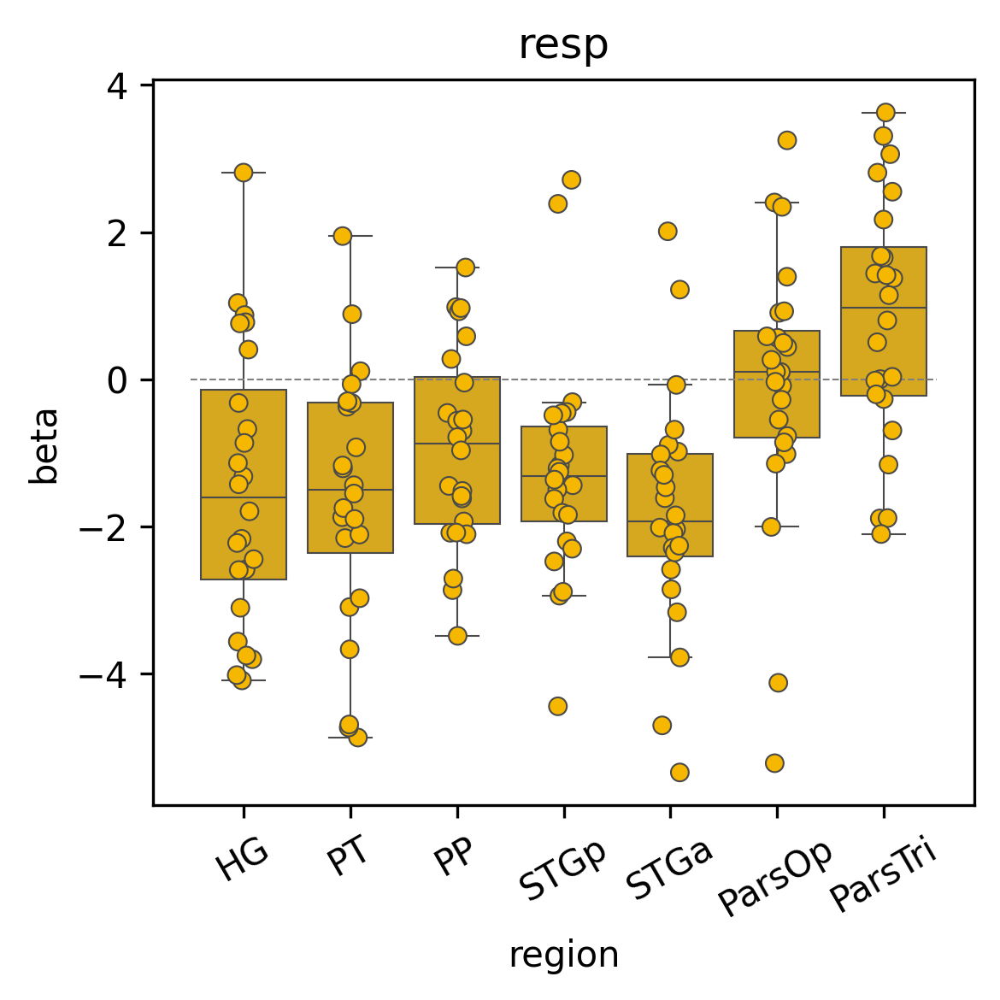

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(4,4), dpi=300)
#yrange = [-3, 3]

sns.boxplot(data=roi_df_long.where(roi_df_long.participant_group=='non-Mandarin'), 
              x='region', y='beta', 
              #hue='hemisphere',
              #palette=['#fdb863','#b2abd2'],
              palette=['#F5B700'],
              linewidth=0.5,
              fliersize = 0,
              legend=None,
              ax=ax);
sns.stripplot(data=roi_df_long.where(roi_df_long.participant_group=='non-Mandarin'), 
              x='region', y='beta', 
              #hue='hemisphere',
              #palette=['#e66101','#5e3c99'],
              #dodge=True,
              palette=['#F5B700'],
              linewidth=0.5,
              ax=ax);
xmin, xmax = ax.get_xlim()
ax.hlines(y=0, xmin=xmin, xmax=xmax, color='0.5', linestyle='--', linewidth=0.5)
#ax.set_ylim(yrange)
ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='center')
#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
ax.set_title(f'{contrast_label}');

fig.tight_layout()


In [20]:
group = 'non-Mandarin'
#for group in np.unique(roi_df.participant_group):
p_vals = []
t_stats = []
print('\nFDR-adjusted statistics')
for roi in np.unique(roi_df_long.region):
    groi_data = roi_df_long.where(roi_df_long.region==roi).where(roi_df_long.participant_group==group).dropna().beta
    res = stats.ttest_1samp(groi_data, popmean=0)
    #print(f't = {res.statistic:.02f} p = {res.pvalue:.04f} region = {roi}')
    p_vals.append(res.pvalue)
    t_stats.append(res.statistic)
p_vals_adj = stats.false_discovery_control(p_vals)
for rx, roi in enumerate(np.unique(roi_df_long.region)):
    if p_vals_adj[rx] < 0.05:
        ast = '**'
    elif p_vals[rx] < 0.05:
        ast = ' *'
    else:
        ast = '  '
    print(f'{ast}t = {t_stats[rx]:.02f} FDR-corr p = {p_vals_adj[rx]:.04f} uncorr p = {p_vals[rx]:.04f} region = {roi}')


FDR-adjusted statistics
**t = -3.81 FDR-corr p = 0.0016 uncorr p = 0.0009 region = HG
**t = -3.36 FDR-corr p = 0.0037 uncorr p = 0.0027 region = PP
**t = -4.49 FDR-corr p = 0.0006 uncorr p = 0.0002 region = PT
  t = -0.25 FDR-corr p = 0.8018 uncorr p = 0.8018 region = ParsOp
**t = 2.37 FDR-corr p = 0.0312 uncorr p = 0.0268 region = ParsTri
**t = -5.47 FDR-corr p = 0.0001 uncorr p = 0.0000 region = STGa
**t = -4.01 FDR-corr p = 0.0013 uncorr p = 0.0006 region = STGp


In [21]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
res_df = pd.DataFrame(columns=['Region of interest', 't-statistic', 'p-value'])
res_df['t-statistic'] = t_stats
res_df['p-value'] = p_vals_adj
#res_df['p-value (FDR-corrected)'].map('{:,.2f}'.format)
res_df['Region of interest'] = np.unique(roi_df_long.region)

res_df

,Region of interest,t-statistic,p-value
0,HG,-3.812,0.002
1,PP,-3.365,0.004
2,PT,-4.488,0.001
3,ParsOp,-0.254,0.802
4,ParsTri,2.366,0.031
5,STGa,-5.474,0.000
6,STGp,-4.008,0.001


In [23]:
group = 'non-Mandarin'
p_vals = []
t_stats = []
print(f'\ngroup = {group}')
print('\nFDR-adjusted statistics')
for roi in region_list:
    groi_data = roi_df.where(roi_df.participant_group==group).dropna()[roi]
    res = stats.ttest_1samp(groi_data, popmean=0)
    #print(f't = {res.statistic:.02f} p = {res.pvalue:.04f} region = {roi}')
    p_vals.append(res.pvalue)
    t_stats.append(res.statistic)
p_vals_adj = stats.false_discovery_control(p_vals)
for rx, roi in enumerate(region_list):
    if p_vals_adj[rx] < 0.05:
        ast = '*'
    else:
        ast = ' '
    print(f'{ast}t = {t_stats[rx]:.02f} p = {p_vals_adj[rx]:.04f} region = {roi}')


group = non-Mandarin

FDR-adjusted statistics
*t = -2.72 p = 0.0401 region = L-HG
*t = -3.11 p = 0.0282 region = L-PT
 t = -1.91 p = 0.1051 region = L-PP
*t = -2.47 p = 0.0482 region = L-STGp
*t = -3.17 p = 0.0282 region = L-STGa
 t = -0.34 p = 0.7948 region = L-ParsOp
 t = 1.30 p = 0.2553 region = L-ParsTri
*t = -2.57 p = 0.0457 region = R-HG
*t = -3.10 p = 0.0282 region = R-PT
*t = -2.77 p = 0.0401 region = R-PP
*t = -3.12 p = 0.0282 region = R-STGp
*t = -4.57 p = 0.0113 region = R-STGa
 t = -0.02 p = 0.9879 region = R-ParsOp
 t = 2.07 p = 0.0885 region = R-ParsTri
